# Table of Contents

* [Introduction](#1)
* [Punter Analysis](#2)
* [Kicker Analysis](#3)
* [Modeling Framework](#4)
* [Model Features](#5)
* [Feature Importance](#6)
* [Play Examples](#7)
* [Conclusion](#8)
* [Appendix](#9)

Authors: Ben Jenkins

Word Count: **1986**

Github [link](https://github.com/BenRossJenkins/NFLBDB2022)

In [1]:
from IPython.display import Image,HTML
from base64 import b64encode
def play(filename):
    html = ''
    video = open(filename,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=800 controls autoplay loop><source src="%s" type="video/mp4"></video>' % src
    return HTML(html)

# Introduction <a id="1"></a>

We present novel metrics for kicker and punter performance derived from statistical analysis of player tracking data. Many NFL fans attribute the outcome of a field goal attempt to factors within the kicker’s control. We apply ensemble modeling techniques to many variables to identify those that most affect play outcomes; examples include field conditions (such as temperature and wind speed) and the relative locations of the offensive and defensive players. Our probabilistic model of a player’s entire performance distribution provides a quantitative framework for evaluating special teams and those players that contribute to the outcomes of a play. This analysis can be used in real-time for game strategy and player evaluation.

New metrics measure performance relative to the average performance in the same play situation. Field goals over expected (**FGOE**), extra points (**XPOE**), and punt yards (**PYOE**) are key metrics. The player’s contribution averaged over a season (**Total Contribution**) weights field goals and extra points appropriately. **Clutch** identifies players who perform best when the game is on the line and under the most pressure. Performance consistency over a season (**Consistency**) and performance trajectory over multiple seasons (**Trend**) are quantified. This analysis highlights that kicker performance tends to be inconsistent over multiple seasons. NFL teams may want to reconsider the salary structure of kickers in favor of reducing guaranteed salaries for performance-based incentives.

A ranking of players is validated by player awards, such as Pro Bowl and All-Pro, and player salaries. This ranking identifies players for acquisition or contract extension and players that could be traded/released.

Our models provide real-time analysis of expected performance. They offer a decision-making tool for teams to assess the tradeoffs of certain plays (such as whether to kick the field goal or go for it on 4th down).


# Punter Analysis <a id="2"></a>

Punter performance metrics are developed using gradient boosting regression trees (XGBoost):  

**Expected Punt Yards (ePY):** Expected punt yardage on every punt play from machine learning model. **ePY** is based on the distance to the end zone, pressure from opposing defenders, weather conditions, kicker speed, acceleration, orientation, and direction of the kicker. This value indicates how an average punter would perform in the same situation. Predictions are made at every time frame from ball snap until the punt attempt. **ePY** is then aggregated over an entire season.

**Punt Yards Over Expected (PYOE):** Difference between the actual and expected punt yards on every play aggregated over a season. A positive **PYOE** indicates the punter outperformed expectations and vice versa. 

**Consistency:** Measure of performance consistency through the standard deviation of **PYOE** in a given season. A lower **Consistency** (low standard deviation) indicates the player has less variation his performance. Unsurprisingly, the best kickers tend to be more consistent in a season as well as over multiple seasons. The correlation between consistency and kicking performance is about -.8, meaning the best kickers tend to be more consistent and vice versa.

For example, Jake Bailey’s actual punt yards were 5 yards farther than expected in 2020. He was significantly more consistent than Matt Darr (**Figure 1**). 

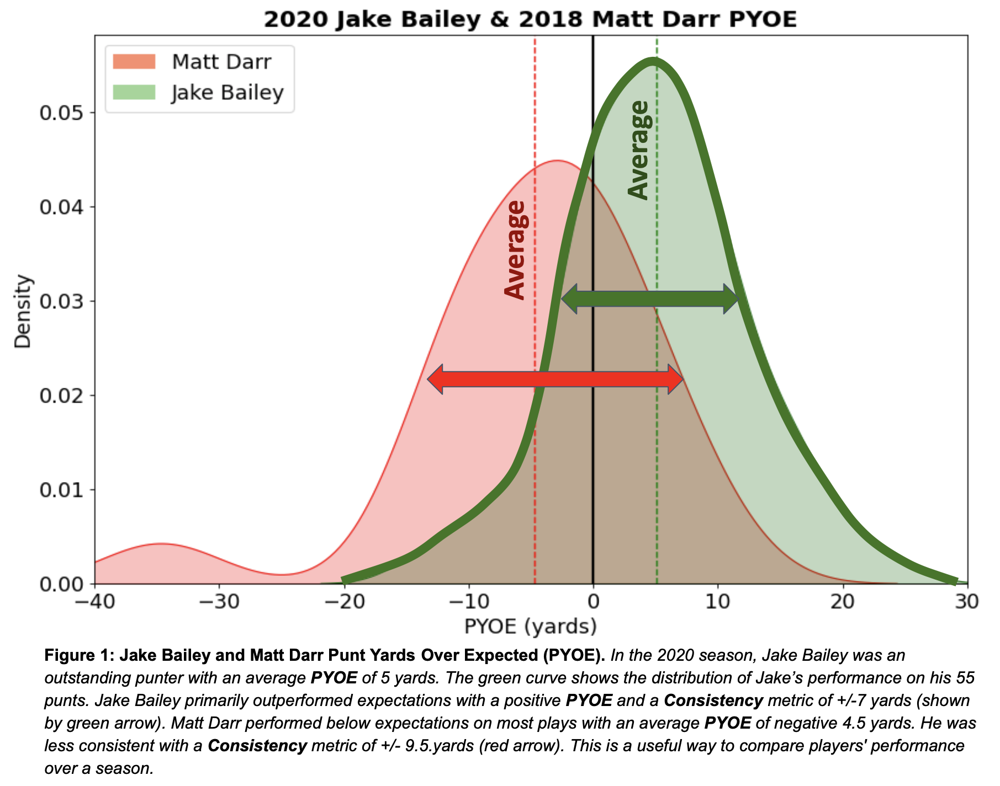

In [2]:
Image("../input/nflbdb/JakeDarrPYOE.png")

**hangTime:** Average hangtime of player's punt in seconds.

**Clutch:** A player’s performance over expected in the fourth quarter within a three-point game. The correlation between **Clutch** and punter performance is .63 indicating that the best punters often perform well in clutch situations.

A list of punters sorted by **PYOE** helps teams evaluate performance (**Figure 2**). Some standout players include Jake Bailey in 2020, Michael Dickson, Corey Bojorquez (2020), Jack Fox (2020), and Brett Kern. Our metrics effectively identify the top kickers as reflected by individual player awards (**as indicated by * and + symbols**) and salary.

In [3]:
HTML("../input/nflbdb/punttable.html")

Comparing a punter’s performance relative to expectations and the expected punt yardage allows for a more detailed review of performance (**Figure 3**). Some punts are predicted to travel less far due to close distance to the end zone, adverse weather conditions, and strong pressure from opposing defenders. This results in less expected punt yardage (**ePY**). **ePY** is computed on every play and aggregated over the entire season. We find that Jake Bailey in the 2020 season strongly outperformed expectations. In contrast, Matt Darr performed significantly worse in the 2018 season on equal expected yardage.

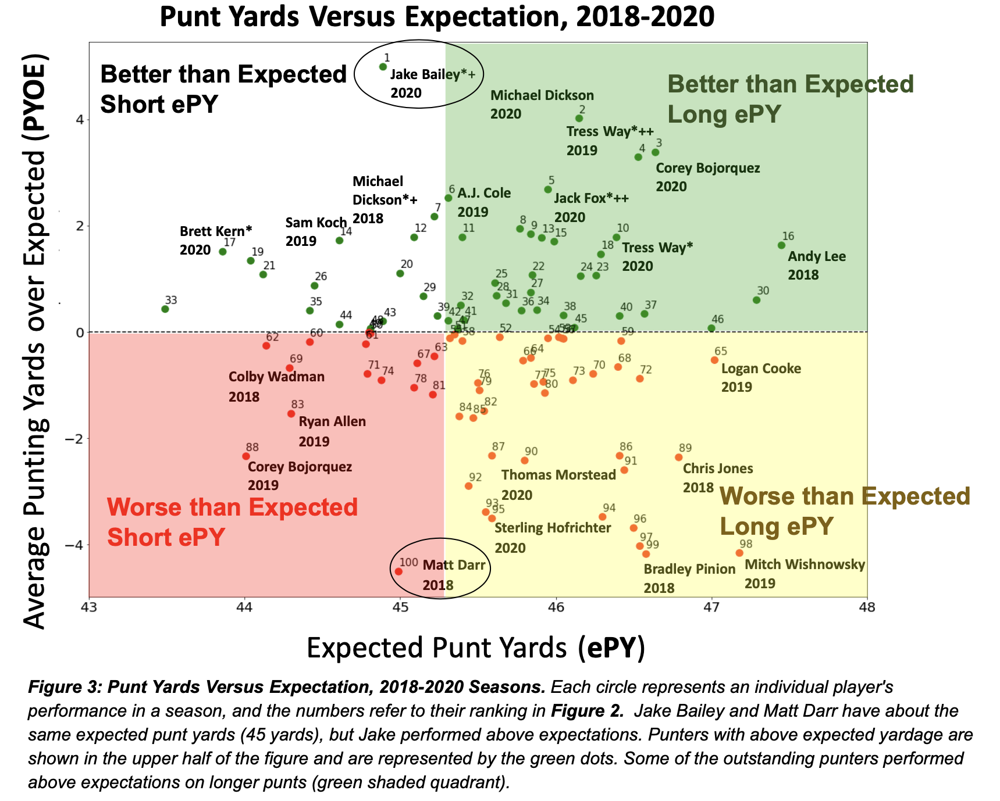

In [4]:
Image("../input/nflbdb/pyoe.png")

# Kicker Analysis <a id="3"></a>

Kicker performance metrics are developed using gradient boosting classification trees (XGBoost). **Clutch** and **Consistency** are computed using the same method as punters.

**Field Goal Percentage Over Expected (FGOE):** The difference between the actual and expected field goal percentage on every field goal attempt aggregated over each season. Predictions are made at every frame up to the field goal attempt. A positive **FGOE** indicates the kicker outperformed expectations and vice versa. 

We can examine a kicker's performance relative to expectations and the difficulty of their field goals (**Figure 4**). Factors that increase field goal difficulty include longer field goals, adverse weather conditions, pressure from opposing defenders, and high kicker speed due to defensive pressure. We find that Will Lutz in the 2018 season outperformed on difficult field goal attempts. In contrast, Jason Meyers performed even better than expected in the 2020 season, but these were easier field goal attempts on average.

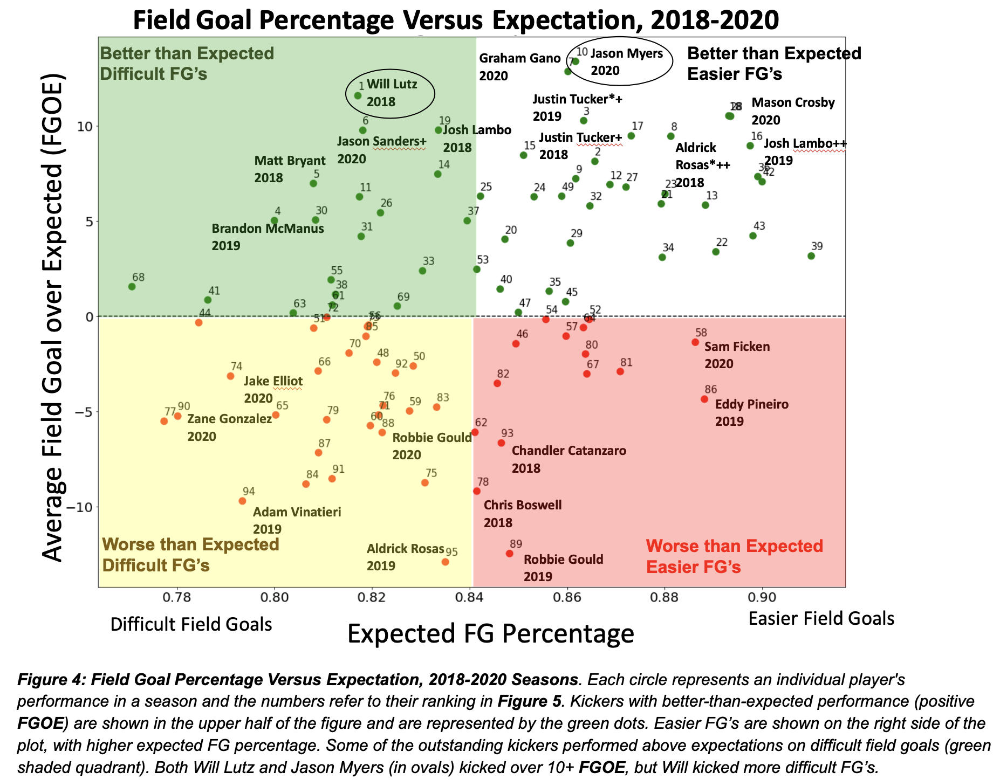

In [5]:
Image("../input/nflbdb/fgoe.png")

**Extra Point Percentage Over Expected (XPOE):** The difference between the actual and expected extra point percentage on every extra point attempt aggregated over each season. Predictions are made at every frame up to the extra point attempt. A positive **XPOE** indicates the kicker outperformed expectations and vice versa. 

**Total Contribution:** The cumulative kicking performance over expected in a given season. Weighs field goals three times higher than extra points and takes into account the number of attempts for each player. A higher value is preferred.

A ranked list of players by **Total Contribution** is developed using these metrics to help teams evaluate kicker performance (**Figure 5**). Each kicker’s performance is evaluated in the 2018-2020 seasons. This provides information on kicker performance trajectory over multiple seasons. 

Some standout players have been identified by this analysis. Justin Tucker, widely regarded as one of the best kickers in the league, had two of the top three seasons from 2018-2020. He consistently ranked high across all of our metrics and as one of the most clutch kickers in the entire NFL. Other kicker standouts include Wil Lutz (2018 & 2019), Brandon McManus, Matt Bryant (2018), Jason Sanders, Aldrick Rosas (2018), and Josh Lambo (2019). The majority of these highly-rated kickers received All-Pro or Pro Bowl honors. They are viewed highly around the league as reflected by salary.

In [6]:
HTML("../input/nflbdb/kickertable.html")

**Trend** measures the change in a kicker's field goal over expected (**FGOE**) from the 2018-2020 seasons. This indicates which player's are improving and those that are declining. Comparing a kicker's **Trend** with his average performance gives teams an insight into player retention and acquisition strategy (**Figure 6**). Many of the best kickers are showing improvement as indicated on the upper right hand quadrant. Some players worse than expected are showing improvement (bottom right quadrant) while others are showing decline (bottom left quadrant). 

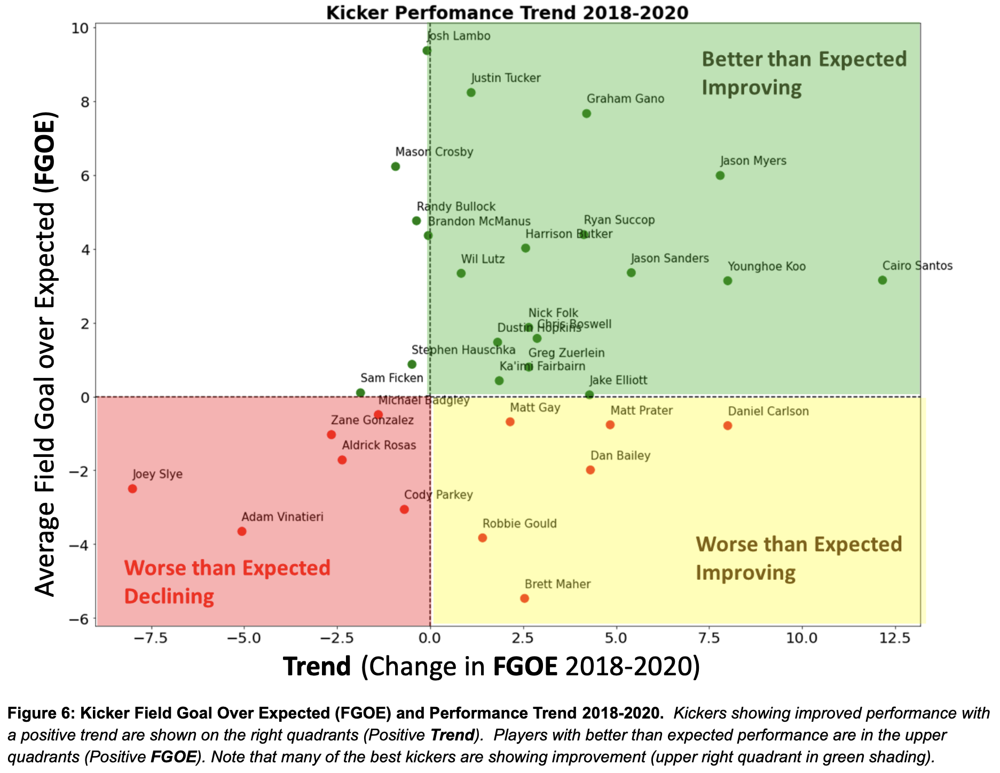

In [7]:
Image("../input/nflbdb/trend.png")

# Modeling Framework <a id="4"></a>

An ensemble of decision tree models were constructed to evaluate kicker and punter performance using XGBoost ([1](https://arxiv.org/pdf/1603.02754.pdf)). Kicking was modeled as a classification task since the outcome of a field goal attempt is binary (either made or miss). Punting was modeled as a regression task since the outcome of a punt is a continuous variable (yards). XGBoost's ability to detect complex nonlinear relationships was well suited for the rich player tracking data. All models used 5-fold cross-validation for model evaluation and tuning, with hyperparameters chosen based on log loss and root mean squared error (RMSE). Models were rigorously tested through cross-validation by withholding games and plays from training.

# Model Features <a id="5"></a>

Over 100 play features were considered to estimate performance. A subset of these were found to have the most utility to extract signals and quantify the difficulty of a play. These key features described below are calculated every tenth of a second. The NGS tracking data was the source of all of these features, except as noted.

- **`s`:** Kicker/Punter speed, yards/second
- **`a`:** Kicker/Punter acceleration, yards/second^2
- **`dis`:** Kicker/Punter distance traveled
- **`o`:** Kicker/Punter orientation, degrees
- **`dir`:** Angle of kicker motion (deg), 0 - 360 degrees
- **`AngleDiff`:** Angular difference between kicker/punter orientation and direction, degrees
- **`diffDir`:** Mean difference in direction of motion between the kicker/punter and the closest opponent player 
- **`oppMean`:** Mean distance from the nearest opposing player to kicker/punter
- **`mateMean`:**  Mean distance from the nearest teammate to kicker/punter
- **`oppMinDist`:** Distance of closest opposing player to kicker/punter
- **`mateMinDist`:** Distance of closest teammate to kicker/punter
- **`oppMateDistRatio`:** Mean distance ratio of the closest opponent player to closest teammate
- **`fg_dist`:** Distance of field goal
- **`Ez_dist`:** Distance to end zone
- **`ScoreDiff`:** Score difference of kicking team
- **`yardsToGo`:** Distance needed for first down
- **`Temperature`:** Temperature in Fahrenheit ([2](https://www.kaggle.com/tombliss/weather-data))
- **`Humidity`:** Humidity in percentage ([2](https://www.kaggle.com/tombliss/weather-data))
- **`Precipitation`:** Precipitation in inches ([2](https://www.kaggle.com/tombliss/weather-data))
- **`WindSpeed`:** Wind speed in miles per hour ([2](https://www.kaggle.com/tombliss/weather-data))

# Feature Importance <a id="6"></a>

Model features are evaluated using **SHAP** ([SHapley Additive exPlanations](http://proceedings.neurips.cc/paper/2017/file/8a20a8621978632d76c43dfd28b67767-Paper.pdf)). SHAP values are a widely used approach to evaluate the output of a machine learning model. SHAP values identify the most important features, such as field goal distance. They also provide accurate local explanations (i.e how a prediction was made on a particular play). 

This provides teams with a ranking and evaluation of the most important features (**Figure 7**) that contribute to a successful field goal. Accounting for field conditions provides better estimates of play difficulty. A close field goal attempt, low wind speed, high temperature, and low angle difference of the kicker (kicker moving and looking in the same direction) are all positive predictors of a successful field goal. Conversely, some negative indicators are adverse weather conditions, high kicker speed, and pressure from opposing players. 

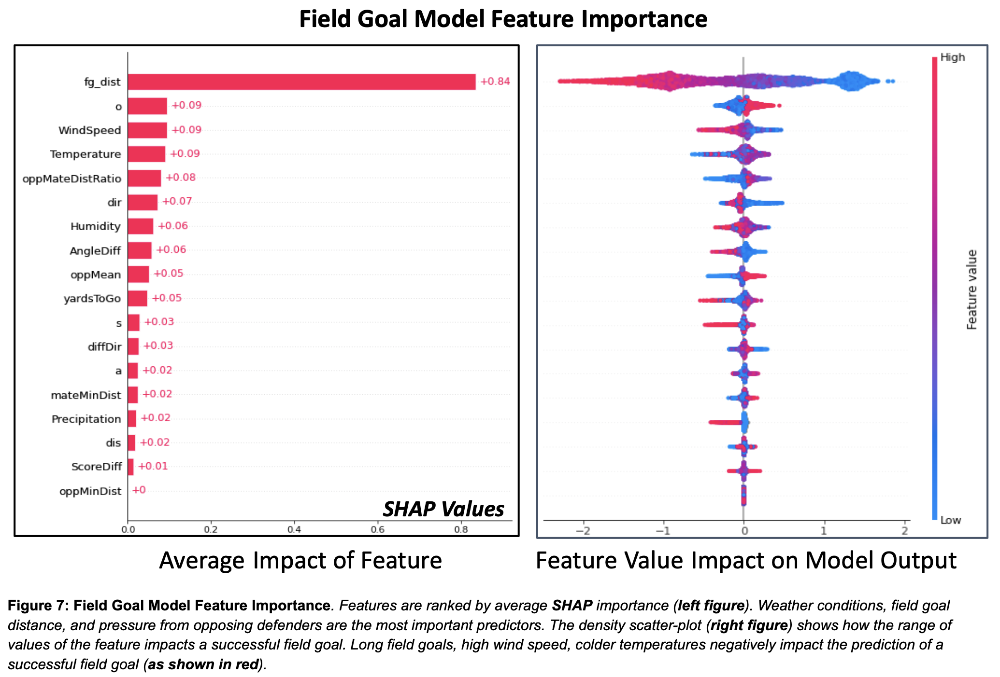

In [8]:
Image("../input/nflbdb/fgshap.png")

Important features in the punt model (**Figure 8**) are the distance to the end zone, temperature, metrics accounting for the proximity of the closest defender to the punter, humidity, and kicker speed. Unsurprisingly, warm weather conditions and less pressure from the defenders are positive predictors of punt length.

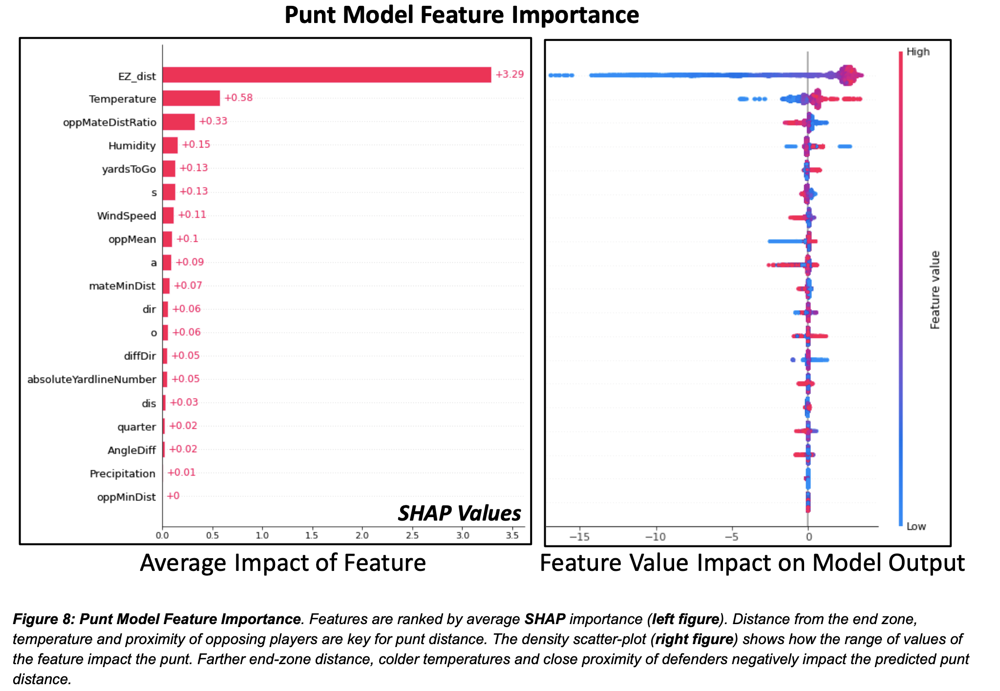

In [9]:
Image("../input/nflbdb/puntshap.png")

# Play Examples <a id="7"></a>

We adapt the space ownership technique from soccer ([3](http://global-uploads.webflow.com/5f1af76ed86d6771ad48324b/5ff4ae0f047e8ed5f14dd294_A%20statistical%20technique%20for%20measuring%20space%20creation%20in%20professional%20soccer.pdf)) as pressure from opposing players is a key factor in the outcome of a play. It quantifies the space that players have to operate. We output a probability of control for every location on the field by considering the location, velocity, and distance to the ball for all 22 players.

The game-winning 49-yard field goal by Justin Tucker illustrates our analysis. The model could be used by teams in real-time to help make play decisions (**Figure 9**). The model initially predicted a success probability of 44.2% due to the distance of the attempt and adverse weather conditions. The field goal probability decreased initially from incoming pressure from Emmanuel Moseley (**#41**). Conversely, we measure defensive performance by how much a player contributed to the decreased probability up to the attempt. Justin Tucker received a field goal percentage over expected (**FGOE**) of 0.53 aggregated over the play.

In [10]:
play('../input/nflbdb/finaltuckerfg.mp4')

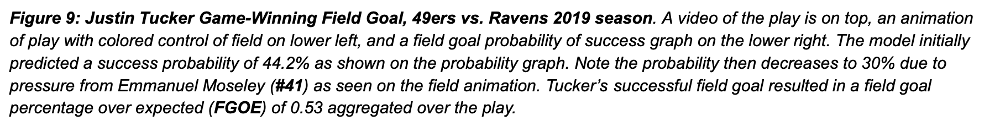

In [11]:
Image("../input/nflbdb/fig9.png")

A 71-yard punt play from Jake Bailey illustrates punter performance allocation and the effect of incoming pressure (**Figure 10**). The punt length was initially predicted at 48.8 yards, slightly longer than average, given the distance to the end zone and decent weather conditions. The prediction decreases significantly after the snap up to the punt from pressure from Ogbonnia Okoronkwo (**#45**) of the LA Rams. Jake Bailey received 27.5 punt yards over expected (**PYOE**) aggregated over the play.

In [12]:
play('../input/nflbdb/jakebailey.mp4')

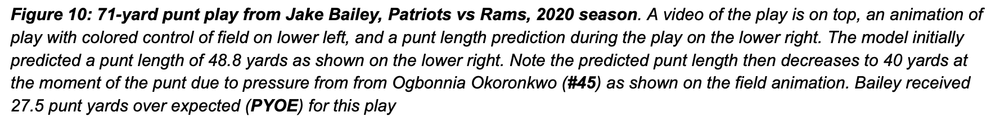

In [13]:
Image("../input/nflbdb/fig10.png")

# Conclusion <a id="7"></a>

Our system provides new insights into the performance of kickers and punters. This analysis is useful for player evaluation, acquisition, and real-time game strategy. We help identify players worthy of acquisition or contract extension and players that could be traded/released. 

We can extend our framework to other plays such as punt and kickoff returns. Other areas for future extension include a ghosting framework to compare player movements to optimal movements. Deep learning techniques have shown strong predictive ability with player tracking data in the past and warrants further investigation.

# Appendix <a id="8"></a>

Classification models are optimized for log loss since we were primarily interested in the predicted probabilities. Field goals are easier to predict than extra points (extra points are missed much less frequently). The field goal model has an AUC of 0.82, log loss of 0.33, and brier score loss of 0.104 on the evaluation set. The extra point model has an AUC of 0.63, log loss of 0.24, and brier score loss of 0.06 on the evaluation set.

The area under the curve of a receiver operating charateristic (**ROC AUC**) is a common classification metric and is particularly well suited for imbalanced tasks (such as predicting whether an extra point will be made or missed). **AUC** compares the true positive rate and false positive rate of a classifier. A perfect model has an AUC of 1 while a random classifier has an AUC of 0.5. The field goal model has an **AUC** of 0.82 on data witheld from training.

Another interpretability method is **permutation importance**. **Permutation importance** measures how much a performance score decreases when a feature isn't available. Instead of removing the feature entirely, it is replaced with random noise (permuted) and measures how the performance changes when the feature is replaced. This is calculated on the test set after the model has been fit. An issue with this method is that it may understate the importance of certain features if there is multicollinearity. **SHAP** is the preferred method when dealing with multicollinearity and identifying interactions in data (such as NFL player tracking data). 

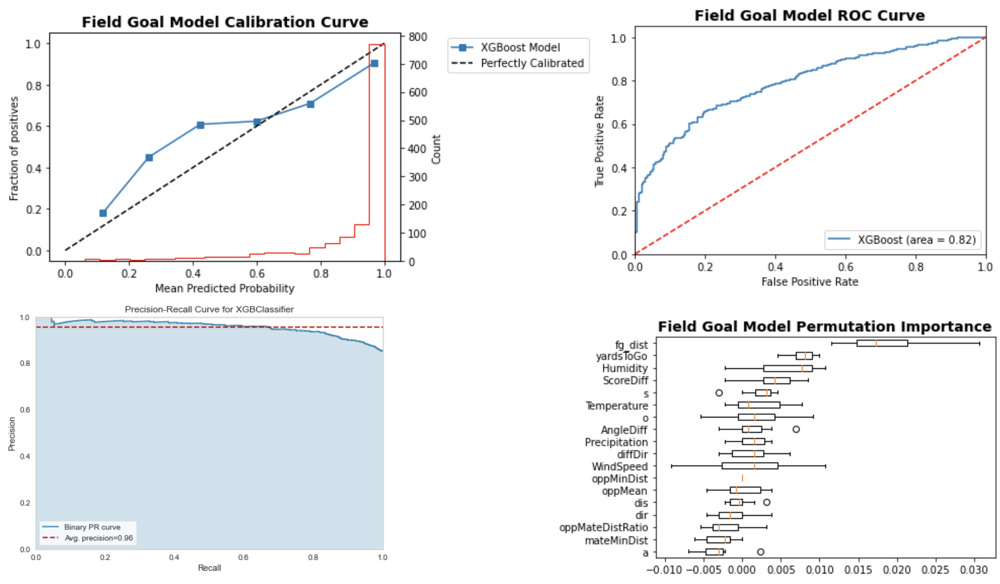

In [14]:
Image("../input/nflbdb/fgeval.png")